# Analysis of NoMa data
- Outcome: Fasting Triglicerides
- Features: Gene expression data


In [31]:
using CSV
using DataFrames
using Plots
using StatsBase
using LinearAlgebra
using MultivariateStats
using PlotlyJS

script_path = normpath(joinpath(@__FILE__, "..", ".."));
include(joinpath(script_path, "src", "utilities", "randomisation_ds.jl"));

In [6]:
# Load data
file_path_outcome = joinpath(script_path, "real_data_analysis", "data", "NoMa_clin_outcome.csv");
file_path_features = joinpath(script_path, "real_data_analysis", "data", "NoMa_microarray.csv");

df_y = CSV.read(file_path_outcome, DataFrame);
df_X = CSV.read(file_path_features, DataFrame);

In [7]:
println("Dimension Gene Expression Data: ", size(df_X))
println("Dimension Outcome fS Triglicerides: ", size(df_y))
genes_names = [nn for nn in names(df_X) if nn != "ID"];

Dimension Gene Expression Data: (239, 1024)
Dimension Outcome fS Triglicerides: (251, 2)


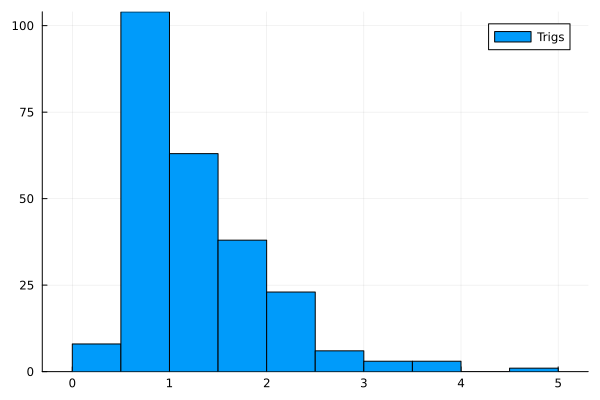

In [9]:
Plots.histogram(df_y.fSTrig, label="Trigs")

In [10]:
minimum(skipmissing(df_y.fSTrig))

0.07

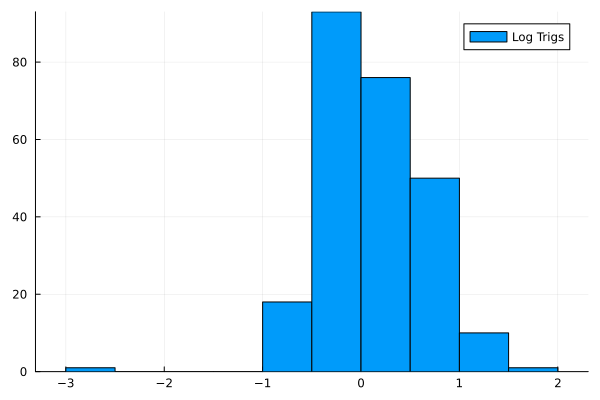

In [12]:
Plots.histogram(log.(df_y.fSTrig), label="Log Trigs")


In [21]:
# Merge y and X
df = DataFrames.innerjoin(df_y, df_X, on=:ID);

In [22]:
# check for missing values
println(names(df)[collect(any(ismissing.(c)) for c in eachcol(df))])
println(collect(sum(ismissing.(c)) for c in eachcol(df)))
DataFrames.dropmissing!(df, "fSTrig");

["fSTrig"]


[0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [24]:
# Get arrays
y = df.fSTrig;
X = Matrix(df[:, genes_names]);

## Pre-Processing

In [25]:
"""
    Take log of y
"""
function outcome_preprocessing(y, log_offset=1e-2)
    return log.(y .+ log_offset)
end

"""
    Sandardise numeric features to have mean 0 and sd 1 
"""
function features_preprocessing(X)
    col_mean = StatsBase.mean(X, dims=1)
    col_sd = StatsBase.std(X, dims=1)
    Xstd = (X .- col_mean) ./ col_sd
    return Xstd
end


features_preprocessing

In [26]:
y = outcome_preprocessing(y)
X = features_preprocessing(X);

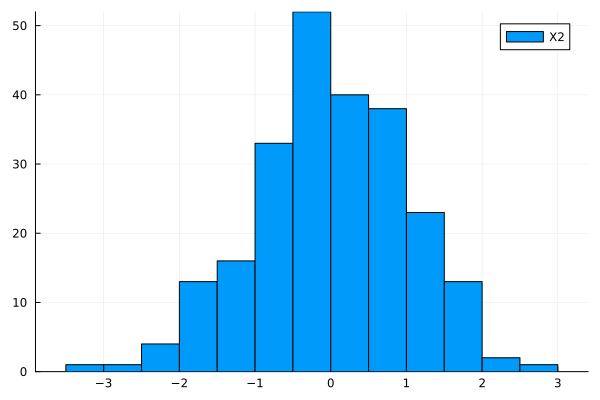

In [28]:
Plots.histogram(X[:, 1], label="X1")
Plots.histogram(X[:, 2], label="X2")

## Exploratory Analysis

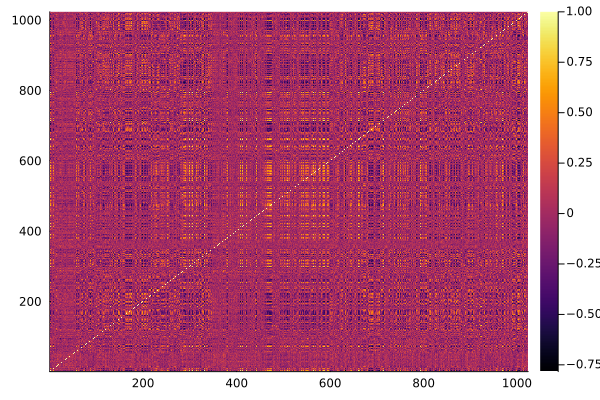

In [29]:
cor_mat = cor(X, dims=1)
Plots.heatmap(cor_mat)

In [30]:
# set diag to 0, not needed
cor_mat[LinearAlgebra.diagind(cor_mat)] .= 0.
cor_over = abs.(cor_mat) .> 0.75

sum(sum(cor_over, dims=1) .!= 0)
sub_genes_names = genes_names[(sum(cor_over, dims=2) .!= 0)[:, 1]]
sub_cor_mat = cor_mat[
    (sum(cor_over, dims=2) .!= 0)[:, 1],
    (sum(cor_over, dims=1) .!= 0)[1,:]
];

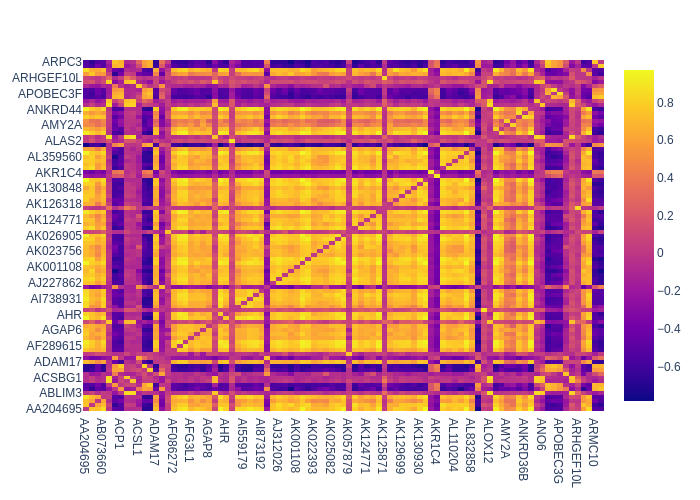

In [32]:
# Using Plotly for an interactive plot
hm_plotly = PlotlyJS.plot(PlotlyJS.heatmap(
    x=sub_genes_names,
    y=sub_genes_names,
    z=sub_cor_mat
))

### Try PCA (and Kernel PCA)

In [33]:
pca_model = MultivariateStats.fit(PCA, transpose(X), maxoutdim=size(X)[2]);

In [35]:
prop_explained_var = principalvars(pca_model) / tvar(pca_model)
cum_prop_explained_var = cumsum(prop_explained_var);

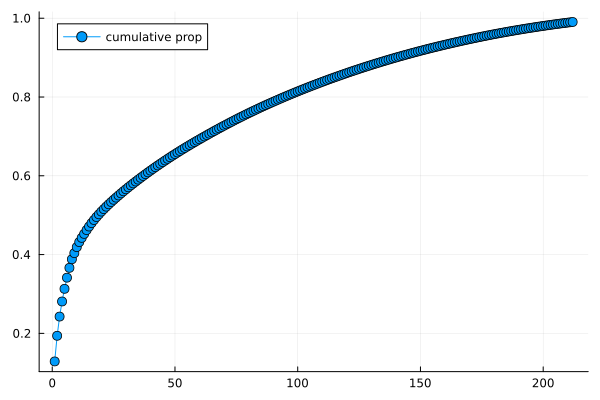

In [37]:
Plots.plot(cum_prop_explained_var, marker=(:circle, 5), label="cumulative prop")

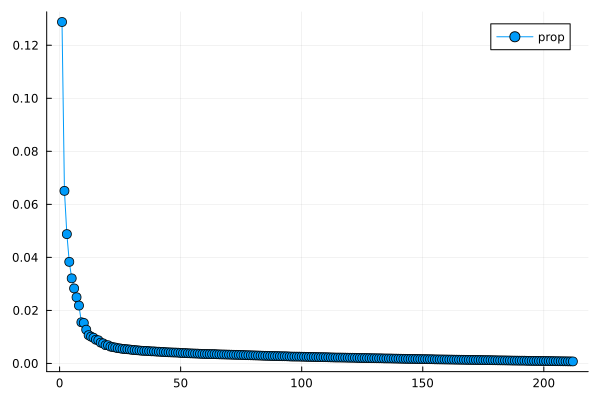

In [38]:
Plots.plot(prop_explained_var, marker=(:circle, 5), label="prop")

In [39]:
# KernelPCA
kpca_model = MultivariateStats.fit(KernelPCA, transpose(X), maxoutdim=size(X)[2]);

In [40]:
prop_explained_var = eigvals(kpca_model::KernelPCA) / sum(eigvals(kpca_model::KernelPCA))
cum_prop_explained_var = cumsum(prop_explained_var);

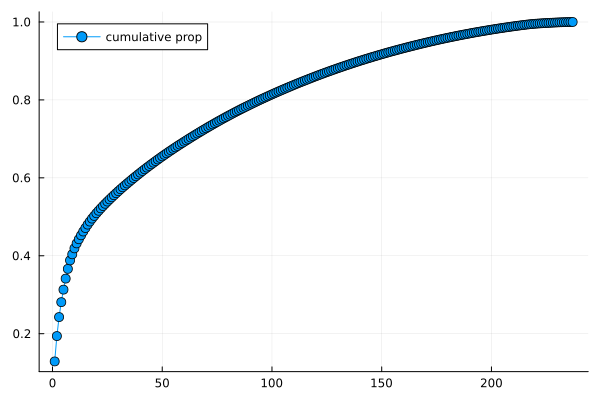

In [42]:
Plots.plot(cum_prop_explained_var, marker=(:circle, 5), label="cumulative prop")

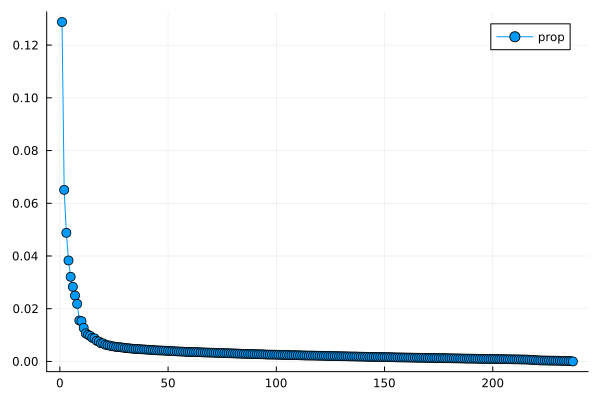

In [43]:
Plots.plot(prop_explained_var, marker=(:circle, 5), label="prop")

PCA and the non-linear KernelPCA do not seem to give good results.
Need a large number of components to explain a decent amount of variance

# Randomisation + Mirror Statistic
Main analysis

In [44]:
# ---------------- FDR: 10% ----------------
res = randomisation_ds.real_data_rand_ms(
    y=y,
    X=X,
    gamma=1.,
    fdr_level=0.1,
    alpha_lasso=1.
)

Dict{String, AbstractVector} with 3 entries:
  "lm_coef"          => [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0…
  "lm_pvalues"       => [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1…
  "selected_ms_coef" => Bool[0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0,…

In [45]:
println("Number of selected features: $(sum(res["selected_ms_coef"]))")
genes_names[res["selected_ms_coef"]]

Number of selected features: 3


3-element Vector{String}:
 "ABCG1"
 "AI207942"
 "ALDH6A1"

In [46]:
# LM coefs and p-values
res["lm_coef"][res["selected_ms_coef"]]

3-element Vector{Float64}:
 -0.1761612324390599
 -0.09215093371184911
 -0.12144717436083104

In [47]:
# ---------------- FDR: 30% ----------------
res = randomisation_ds.real_data_rand_ms(
    y=y,
    X=X,
    gamma=1.,
    fdr_level=0.3,
    alpha_lasso=1.
)

Dict{String, AbstractVector} with 3 entries:
  "lm_coef"          => [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0…
  "lm_pvalues"       => [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1…
  "selected_ms_coef" => Bool[0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0,…

In [49]:
println("Number of selected features: $(sum(res["selected_ms_coef"]))")
println(genes_names[res["selected_ms_coef"]])

# LM coefs and p-values
res["lm_coef"][res["selected_ms_coef"]]

Number of selected features: 4
["AA995952", "ABCG1", "AK027322", "ALDH6A1"]


4-element Vector{Float64}:
  0.09734748114839084
 -0.2078536407028306
 -0.17138932014535765
 -0.17700573308339512